In [135]:
from typing import List
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
import pyro
import pyro.distributions as dist
import pyro.optim as optim
import seaborn as sns
import torch
from pyro.infer import SVI, Predictive, Trace_ELBO
from pyro.infer.autoguide import AutoMultivariateNormal, init_to_mean
import plotly.express as px
import collab.foraging.toolkit as ft

from collab.utils import find_repo_root
root = find_repo_root()
import logging
import time

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(message)s")
derivation_logger = logging.getLogger(__name__)

# Hyperparameters for each fish age

## Redoing analysis using new parameters from param_selection_v2.ipynb

The trend seen here seems to depend a lot on the grid size choice. 

For the choice of 1 grid unit = 1 BL, there is a slight trend towards increasing proximity weights with age (only for raw scores)

But doubling the grid size gets rid of this trend.

This is concerning. I think that having a very small grid size can lead to weird results because it causes the calculated velocity direction (which is used to compute vicsek predictors) be biased towards pure x,y components. 

In [196]:
exp_names = ["2wpf_091522_3", "4wpf_060222_5", "6wpf_091522_2", "8wpf_070122_1"]
arena_size = [150,300,300,300] #in mm

# params for discretization 
frame_spacing = [221, 61, 66, 41]

grid_size = np.array([38, 43, 30, 25])

# local windows
window_size = 5 #grid units
sampling_fraction = 1

# grid constraint
def circular_constraint_func(grid, c_x, c_y, R):
    ind = ((grid["x"] - c_x) ** 2 + (grid["y"] - c_y) ** 2) < R**2
    return grid.loc[ind]

# interaction length (same for all predictors)
L = 50 # units : mm. Note that numerical value may differ for each age after unit conversion

# velocity predictors
sigma_v = 6 # units : mm/frame_spacing, i.e. we only need to convert length units. Numerical value may be different for each age after unit conversion!
sigma_t = 1 # units : rds. Same for all ages

# proximity predictor parameters. These are different for each age as they scale with bodylength!
# need to convert these values from mm to grid units!
repulsion_radius = [4, 7, 10, 12] #mm
optimal_proximity = [6, 10.5, 15, 18] #mm
proximity_decay = 0.1 #(mm)^-1

# score_kwargs
decay_length = 2 #grid units

# Generate predictors

In [197]:
def get_derivedDF(exp : str, exp_index : int):
    print("-"*50)
    print(f"Computing derivedDF for experiment: {exp}")
    print("-"*50)
    start = time.time()
    raw_data = pd.read_csv(
        os.path.join(
            root,
            f"data/foraging/fish/{exp}.csv",
        )
    )

    # generate data object after subsampling
    processed_data = ft.rescale_to_grid(ft.subsample_frames_constant_frame_rate(raw_data, frame_spacing=frame_spacing[exp_index]), gridMax=arena_size[exp_index], size=grid_size[exp_index])
    object = ft.dataObject(foragersDF=processed_data, grid_size=grid_size[exp_index])

    # create dictionaries for predictor/score kwargs by changing to appropriate units
    length_conversion = grid_size[exp_index]/arena_size[exp_index] #grid_units / mm

    grid_constraint_params = {
        "c_x": grid_size[exp_index]/ 2,
        "c_y": grid_size[exp_index]/ 2,
        "R": grid_size[exp_index]/ 2,
    }

    predictor_kwargs = {
        "proximity": {
            "interaction_length": L * length_conversion,
            "optimal_distance": optimal_proximity[exp_index] * length_conversion,
            "repulsion_radius": repulsion_radius[exp_index] * length_conversion,
            "proximity_decay": proximity_decay / length_conversion,
        },

        "vicsek": {
            "interaction_length" : L* length_conversion,
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        },

        "velocityDiffusion": {
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        }
    }

    local_windows_kwargs = {
        "window_size": window_size,
        "sampling_fraction": sampling_fraction,
        "skip_incomplete_frames": True,
        "grid_constraint" : circular_constraint_func,
        "grid_constraint_params" : grid_constraint_params

    }

    score_kwargs = {
        "nextStepExponential": {
                "decay_length" : decay_length
            }
    }

    derivedDF = ft.derive_predictors_and_scores(
        object,
        local_windows_kwargs,
        predictor_kwargs=predictor_kwargs,
        score_kwargs=score_kwargs,
        dropna=True,
        add_scaled_values=True
        )
    end = time.time()
    print("\n\n")
    derivation_logger.info(f"Experiment {exp} completed in {end-start:.2f} seconds.")
    return derivedDF

In [198]:
exp_wise_derivedDF = {}

for i,exp in enumerate(exp_names):
    derivedDF = get_derivedDF(exp_index=i, exp=exp)

    exp_wise_derivedDF[exp] = derivedDF

--------------------------------------------------
Computing derivedDF for experiment: 2wpf_091522_3
--------------------------------------------------
original_frames: 36107
original_shape: (144428, 4)
resulting_frames: 164
resulting_shape: (656, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-31 10:17:31,880 - Local windows completed in 4.24 seconds.
2024-12-31 10:17:36,020 - proximity completed in 4.14 seconds.
2024-12-31 10:17:41,779 - vicsek completed in 5.76 seconds.
2024-12-31 10:17:45,563 - velocityDiffusion completed in 3.78 seconds.
2024-12-31 10:17:46,694 - nextStepExponential completed in 1.13 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 4020/37829 (~10.63%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend 




--------------------------------------------------
Computing derivedDF for experiment: 4wpf_060222_5
--------------------------------------------------
original_frames: 18739
original_shape: (74956, 4)
resulting_frames: 308
resulting_shape: (1232, 4)


2024-12-31 10:17:56,120 - Local windows completed in 8.84 seconds.
2024-12-31 10:18:06,004 - proximity completed in 9.88 seconds.
2024-12-31 10:18:19,376 - vicsek completed in 13.37 seconds.
2024-12-31 10:18:27,025 - velocityDiffusion completed in 7.65 seconds.
2024-12-31 10:18:29,632 - nextStepExponential completed in 2.61 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 640/98412 (~0.65%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-31 10:18:30,521 - derivedDF generated in 0.89 seconds.
2024-12-31 10:18:30,522 - Experiment 4wpf_060222_5 completed in 43.31 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 6wpf_091522_2
--------------------------------------------------
original_frames: 36779
original_shape: (147116, 4)
resulting_frames: 558
resulting_shape: (2232, 4)


2024-12-31 10:18:47,386 - Local windows completed in 16.68 seconds.
2024-12-31 10:19:06,717 - proximity completed in 19.33 seconds.
2024-12-31 10:19:31,588 - vicsek completed in 24.87 seconds.
2024-12-31 10:19:47,161 - velocityDiffusion completed in 15.57 seconds.
2024-12-31 10:19:52,321 - nextStepExponential completed in 5.16 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 528/167430 (~0.32%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      

2024-12-31 10:19:53,618 - derivedDF generated in 1.30 seconds.
2024-12-31 10:19:53,619 - Experiment 6wpf_091522_2 completed in 83.03 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 8wpf_070122_1
--------------------------------------------------
original_frames: 37226
original_shape: (148904, 4)
resulting_frames: 908
resulting_shape: (3632, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning:


                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                

2024-12-31 10:20:20,539 - Local windows completed in 26.70 seconds.
2024-12-31 10:20:59,816 - proximity completed in 39.28 seconds.
2024-12-31 10:21:46,864 - vicsek completed in 47.05 seconds.
2024-12-31 10:22:09,468 - velocityDiffusion completed in 22.60 seconds.
2024-12-31 10:22:16,653 - nextStepExponential completed in 7.18 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning:


                      Dropped 1599/254298 (~0.63%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations dep

# Model

In [199]:
class FishModel(pyro.nn.PyroModule):
    def __init__(self, predictors: dict, score: dict):
        super().__init__()

        self.predictors = predictors
        self.score = score
        self.n = len(score)

    def forward(self, predictors=None, score=None):
        if predictors is None:
            predictors = self.predictors

        size = len(next(iter(predictors.values())))

        weights = {}
        sigmas = {}
        for key in predictors.keys():
            weights[key] = pyro.sample(f"weight_{key}", dist.Normal(0.0, 1))
            sigmas[key] = pyro.sample(f"sigma_{key}", dist.Exponential(10.0))

        weights["b"] = pyro.sample("b", dist.Normal(0.5, 0.3))
        sigmas["bs"] = pyro.sample("bs", dist.Exponential(10.0))

        with pyro.plate("data", size):
            sigma = pyro.deterministic(
                "sigma",
                sum([predictors[key] * sigmas[key] for key in predictors.keys()])
                + sigmas["bs"],
            )

            sigma = torch.nn.functional.softplus(sigma) #since proximity predictor can be negative!

            assert torch.all(sigma > 0), "Sigma is not positive"

            mean = pyro.deterministic(
                "mean",
                sum([predictors[key] * weights[key] for key in predictors.keys()])
                + weights["b"],
            )

            observed_score = None
            if score is not None:
                observed_score = next(iter(score.values())) # gets the values without knowing the key ie score name

            pyro.sample("predicted_score", dist.Normal(mean, sigma), obs=observed_score)

# Helper functions for inference, model evaluation and visualization

In [200]:
def get_tensors_for_inference(
    derivedDF: pd.DataFrame, predictor_names: List[str], score_names: List[str]
):
    predictors = {}
    for name in predictor_names:
        predictors[name] = torch.tensor(derivedDF[name].values)

    scores = {}
    for name in score_names:
        scores[name] = torch.tensor(derivedDF[name].values)

    return predictors, scores

def run_svi_and_get_samples(
    model, predictors, score, num_svi_iters=600, verbose=False, num_samples=1000
):
    guide = AutoMultivariateNormal(model, init_loc_fn=init_to_mean)
    svi = SVI(model, guide, optim.Adam({"lr": 0.01}), loss=Trace_ELBO())

    iterations = []
    losses = []

    logging.info(f"Starting SVI inference with {num_svi_iters} iterations.")
    start_time = time.time()
    pyro.clear_param_store()
    for i in range(num_svi_iters):
        elbo = svi.step(predictors=predictors, score=score)
        iterations.append(i)
        losses.append(elbo)
        if i % 200 == 0:
            logging.info("Step {}, elbo loss: {}".format(i, elbo))
    end_time = time.time()
    elapsed_time = end_time - start_time
    logging.info("SVI inference completed in %.2f seconds.", elapsed_time)

    if verbose:
        fig = px.line(
            x=iterations, y=losses, title="ELBO loss", template="presentation"
        )
        labels = {"iterations": "iteration", "losses": "loss"}
        fig.update_xaxes(showgrid=False, title_text=labels["iterations"])
        fig.update_yaxes(showgrid=False, title_text=labels["losses"])
        fig.update_layout(width=700)
        fig.show()

    site_names = [f"weight_{key}" for key in predictors.keys()]
    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=site_names,
    )
    samples = predictive(predictors=predictors, score=score)
    return guide, samples

# getting score predictions is slower. only do that for a fraction of datapoints
# and fewer samples!
def evaluate_performance(
    model, guide, predictors, score, num_samples=100, sampling_fraction=1
):
    score_name = next(iter(score.keys()))

    sub_size = int(score[score_name].size(0) * sampling_fraction)
    randinds = torch.randint(0, score[score_name].size(0), (sub_size,))

    # downsample predictors and score
    score_sub = {score_name: score[score_name][randinds]}

    predictors_sub = {}
    for key, value in predictors.items():
        predictors_sub[key] = value[randinds]

    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=["predicted_score"],
    )
    samples = predictive(predictors=predictors_sub, score=None)

    predictions = samples["predicted_score"]

    predictions_mean = predictions.mean(dim=0)
    predictions_lower = predictions.quantile(0.025, dim=0)
    predictions_upper = predictions.quantile(0.975, dim=0)

    coverage = (
        (
            (predictions_lower <= score_sub[score_name])
            & (score_sub[score_name] <= predictions_upper)
        )
        .float()
        .mean()
    )

    observed_mean = score_sub[score_name].mean()

    residuals = score_sub[score_name] - predictions_mean

    mae = (torch.abs(residuals)).mean()

    rsquared = 1 - (
        torch.sum(residuals**2)
        / torch.sum((score_sub[score_name] - observed_mean) ** 2)
    )

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    heatmap = ax[0].hexbin(
        score_sub[score_name],
        predictions_mean,
        gridsize=100,
        cmap="Blues",
        norm=mpl.colors.LogNorm(),
    )
    fig.colorbar(heatmap, ax=ax[0])
    ax[0].set_title("Ratio of outcomes within 95% CI: {:.2f}".format(coverage.item()))
    ax[0].set_xlabel("observed values")
    ax[0].set_ylabel("mean predicted values")

    ax[1].hist(residuals.detach().numpy(), bins=50)
    ax[1].set_title(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")
    ax[1].set_xlabel("residuals")
    ax[1].set_ylabel("count")

    # print(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    sns.despine()
    fig.suptitle("Model evaluation", fontsize=16)
    plt.show()


def plot_density(predictors, scores, title):
    n_plots = len(predictors) * len(scores)
    #print(n_plots)
    ncols = 3
    nrows = np.ceil(n_plots / ncols).astype(int)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows))

    plot_index = 0
    for i, predictor_name in enumerate(predictors.keys()):
        for j, score_name in enumerate(scores.keys()):

            if nrows > 1:
                r = plot_index // ncols
                c = plot_index % ncols
                #print([r,c])
                ax = axes[r, c]
            else:
                ax = axes[plot_index]

            heatmap = ax.hexbin(
                predictors[predictor_name],
                scores[score_name],
                gridsize=100,
                cmap="Blues",
                norm=mpl.colors.LogNorm(),
            )
            fig.colorbar(heatmap, ax=ax)
            ax.set_xlabel(f"{predictor_name} predictor")
            ax.set_ylabel(f"{score_name} score")
            # ax.set_aspect("equal")
            plot_index += 1

    # remove unused plots
    if n_plots % ncols:
        for ind in range(n_plots % ncols, ncols):
            if nrows > 1:
                fig.delaxes(axes[nrows-1,ind])
            else:
                fig.delaxes(axes[ind])

    fig.suptitle(title)
    fig.tight_layout()


def plot_distributions(derivedDF, column_names, title):
    fig, ax = plt.subplots(1, len(column_names), figsize=(3 * len(column_names), 3))

    for i, column in enumerate(column_names):
        ax[i].hist(derivedDF[column], bins=20, density=True, alpha=1)
        ax[i].set_yscale("log")
        ax[i].set_ylim([10**-3, 10**2])
        ax[i].set_xlabel(column)
        ax[i].set_ylabel("PDF")

    fig.suptitle(title)
    fig.tight_layout()

# Inference using raw predictors and scores

In [201]:
score_names = ["nextStepExponential"]
predictor_names = ["proximity", "vicsek", "velocityDiffusion"]

### Visualize the predictors and scores for each age

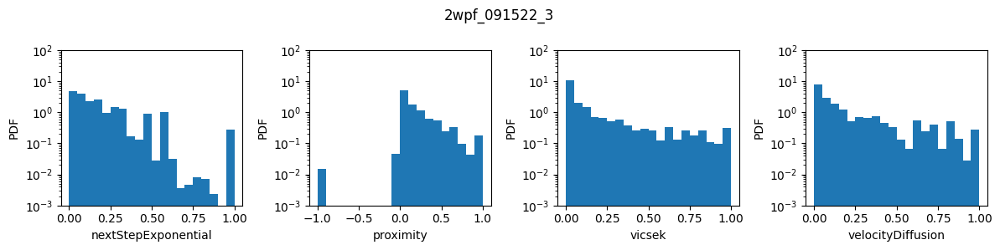

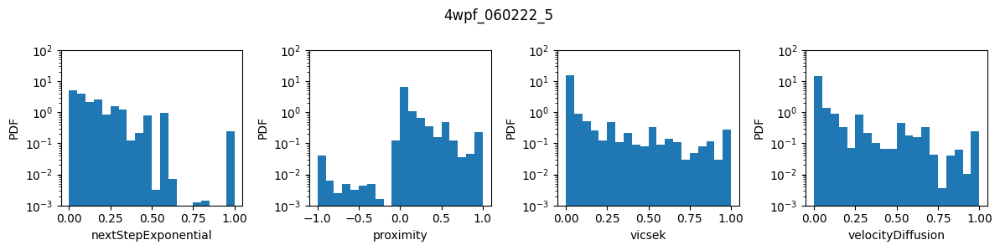

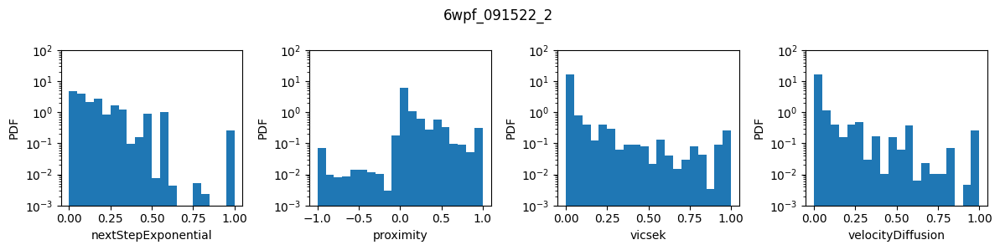

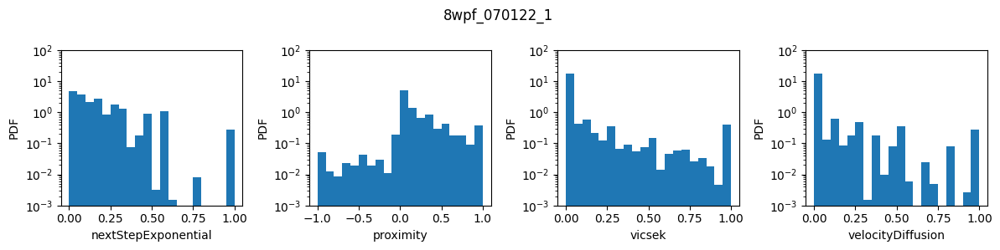

In [202]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [203]:
coefficients_raw = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-31 10:22:30,618 - Starting SVI inference with 1000 iterations.
2024-12-31 10:22:30,648 - Step 0, elbo loss: 31291.827295852992
2024-12-31 10:22:34,167 - Step 200, elbo loss: 20337.721021617275
2024-12-31 10:22:37,536 - Step 400, elbo loss: 19871.12255672492
2024-12-31 10:22:42,448 - Step 600, elbo loss: 19674.823639579427
2024-12-31 10:22:47,056 - Step 800, elbo loss: 19595.594022203797
2024-12-31 10:22:50,922 - SVI inference completed in 20.30 seconds.


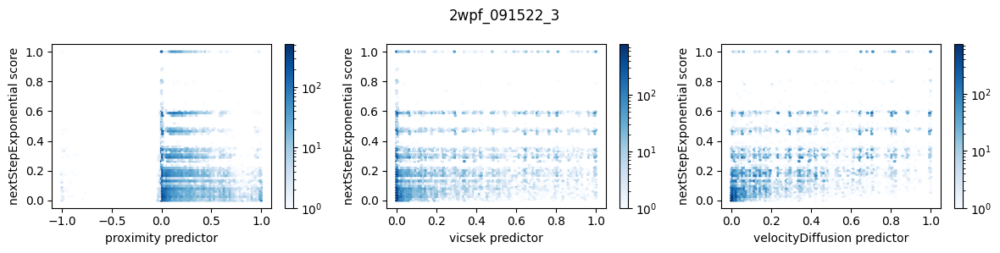

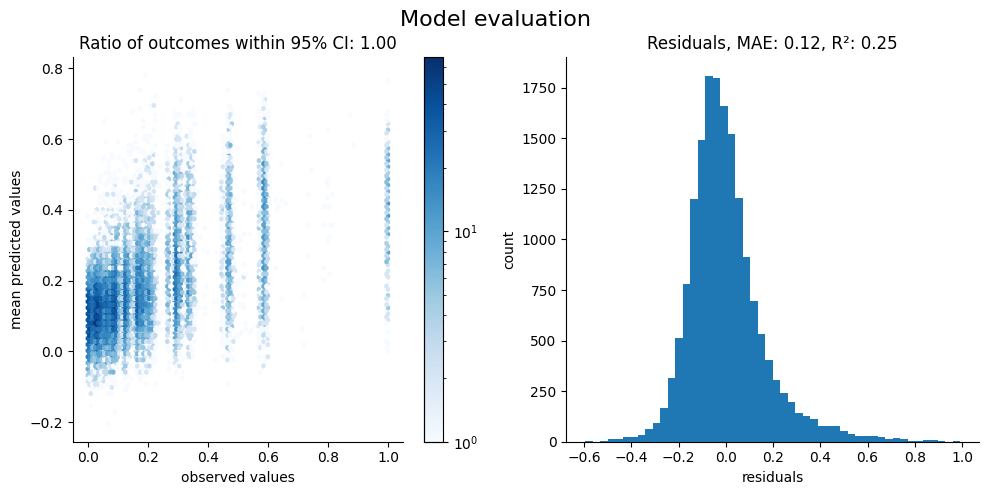

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-31 10:23:05,176 - Starting SVI inference with 1000 iterations.
2024-12-31 10:23:05,259 - Step 0, elbo loss: 76671.49201067458
2024-12-31 10:23:11,514 - Step 200, elbo loss: 58046.85811051847
2024-12-31 10:23:15,908 - Step 400, elbo loss: 57402.25557652011
2024-12-31 10:23:19,755 - Step 600, elbo loss: 56634.498068860026
2024-12-31 10:23:24,125 - Step 800, elbo loss: 56539.7820487138
2024-12-31 10:23:28,284 - SVI inference completed in 23.10 seconds.


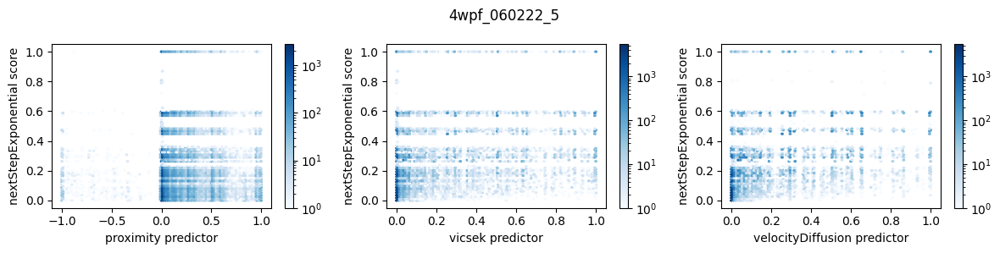

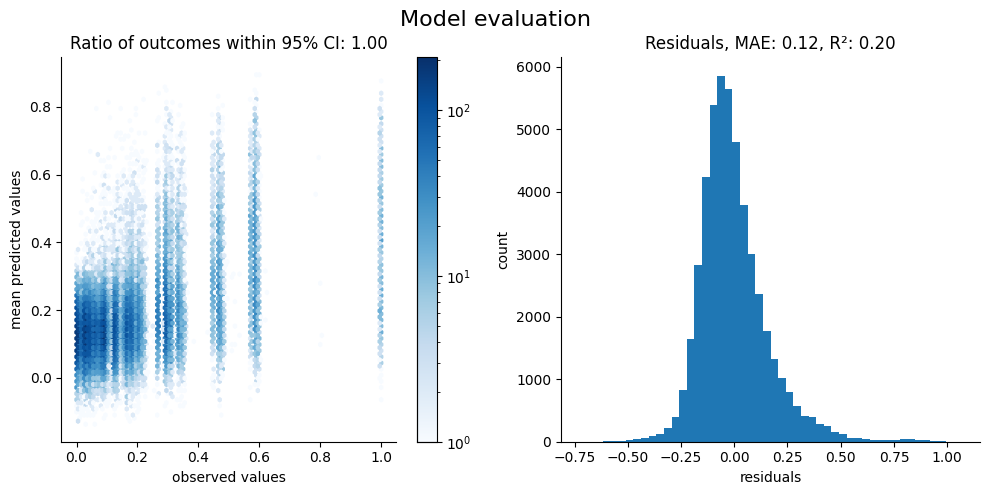

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-31 10:23:46,093 - Starting SVI inference with 1000 iterations.
2024-12-31 10:23:46,269 - Step 0, elbo loss: 122717.35153495935
2024-12-31 10:23:50,490 - Step 200, elbo loss: 99731.23875140044
2024-12-31 10:23:55,257 - Step 400, elbo loss: 97789.36648305226
2024-12-31 10:23:59,943 - Step 600, elbo loss: 97115.41357649154
2024-12-31 10:24:05,698 - Step 800, elbo loss: 96693.66814080885
2024-12-31 10:24:10,573 - SVI inference completed in 24.48 seconds.


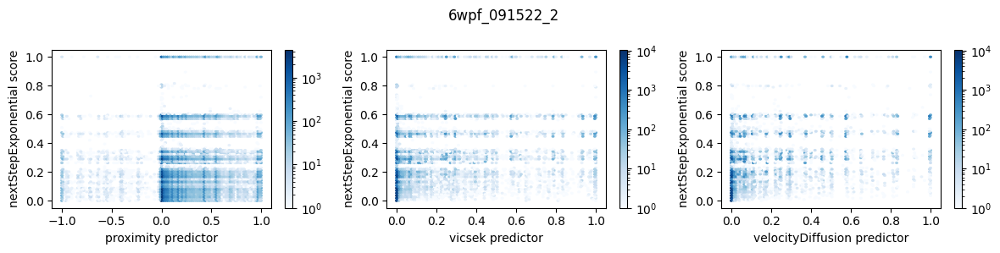

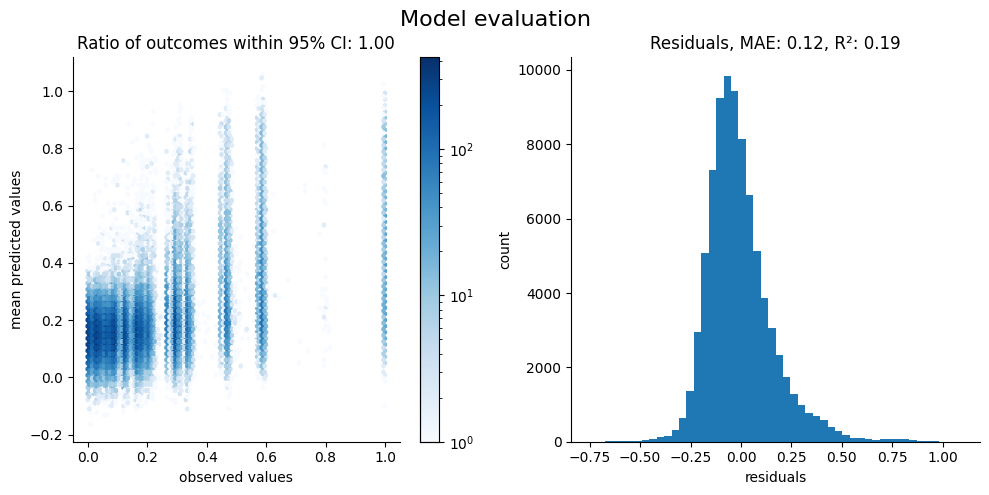

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-31 10:24:34,706 - Starting SVI inference with 1000 iterations.
2024-12-31 10:24:35,011 - Step 0, elbo loss: 197367.7257811727
2024-12-31 10:24:40,841 - Step 200, elbo loss: 151623.48926847967
2024-12-31 10:24:46,969 - Step 400, elbo loss: 147980.12846752425
2024-12-31 10:24:52,785 - Step 600, elbo loss: 146899.90977214553
2024-12-31 10:24:58,720 - Step 800, elbo loss: 146444.90088269388
2024-12-31 10:25:05,829 - SVI inference completed in 31.12 seconds.


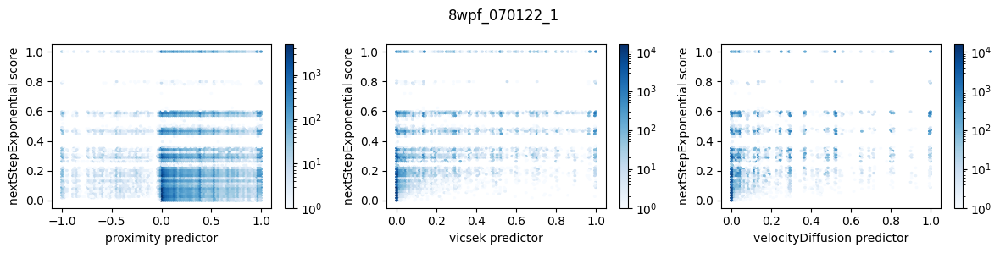

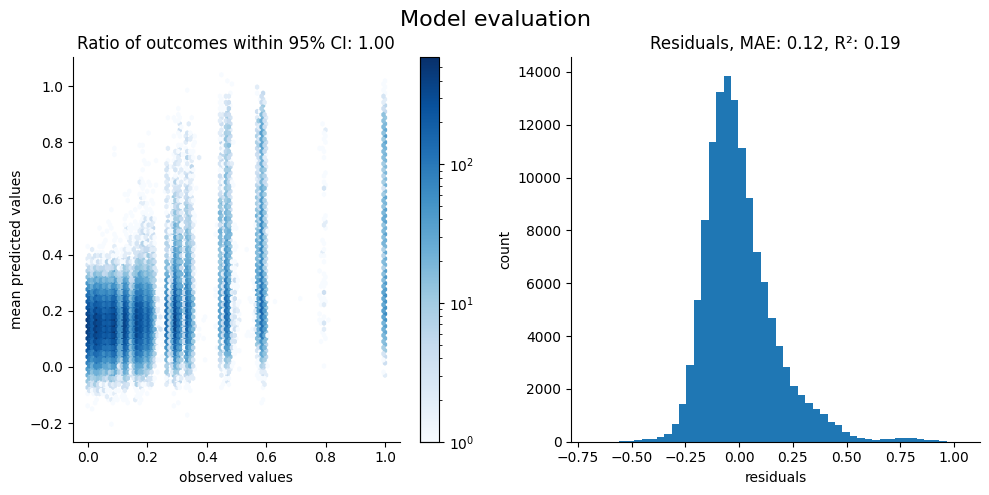

In [204]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw[exp] = samples

# Repeat for scaled scores

In [205]:
score_names = ["nextStepExponential_scaled"]
predictor_names = ["proximity_scaled", "vicsek_scaled", "velocityDiffusion_scaled"]

### Visualize the predictors and scores for each age

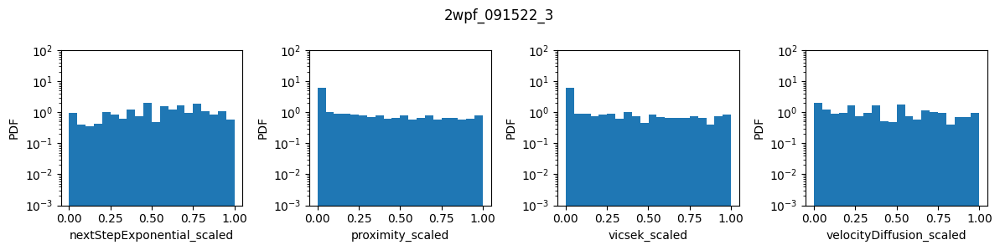

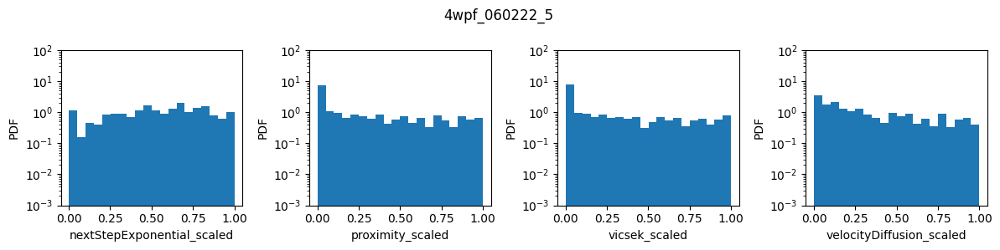

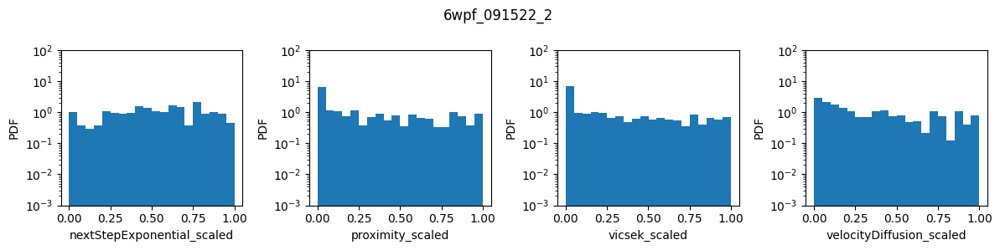

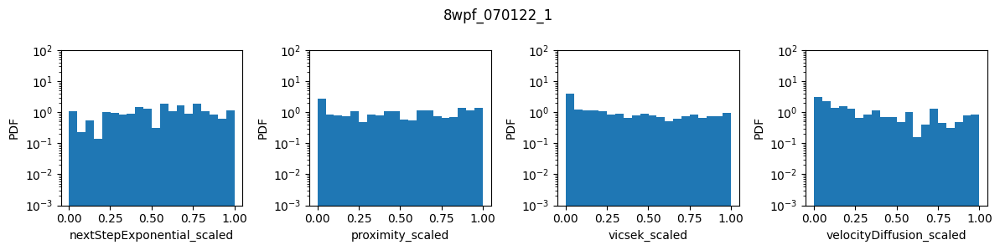

In [206]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [207]:
coefficients_scaled = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-31 10:25:36,444 - Starting SVI inference with 1000 iterations.
2024-12-31 10:25:36,468 - Step 0, elbo loss: 25666.307776786303
2024-12-31 10:25:40,360 - Step 200, elbo loss: 21343.638838802457
2024-12-31 10:25:44,445 - Step 400, elbo loss: 20680.31494096423
2024-12-31 10:25:48,354 - Step 600, elbo loss: 20435.614721796424
2024-12-31 10:25:53,001 - Step 800, elbo loss: 20274.92232631781
2024-12-31 10:25:57,362 - SVI inference completed in 20.92 seconds.


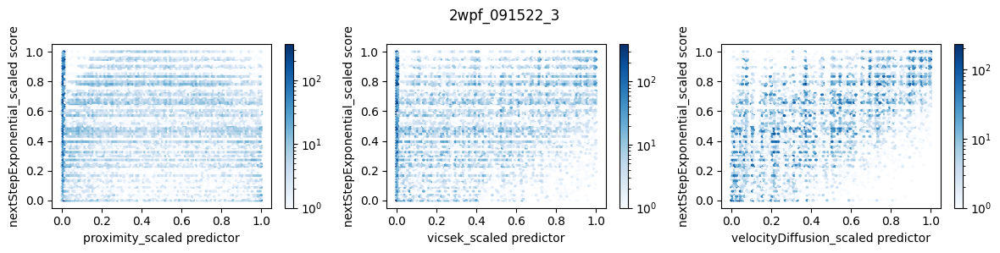

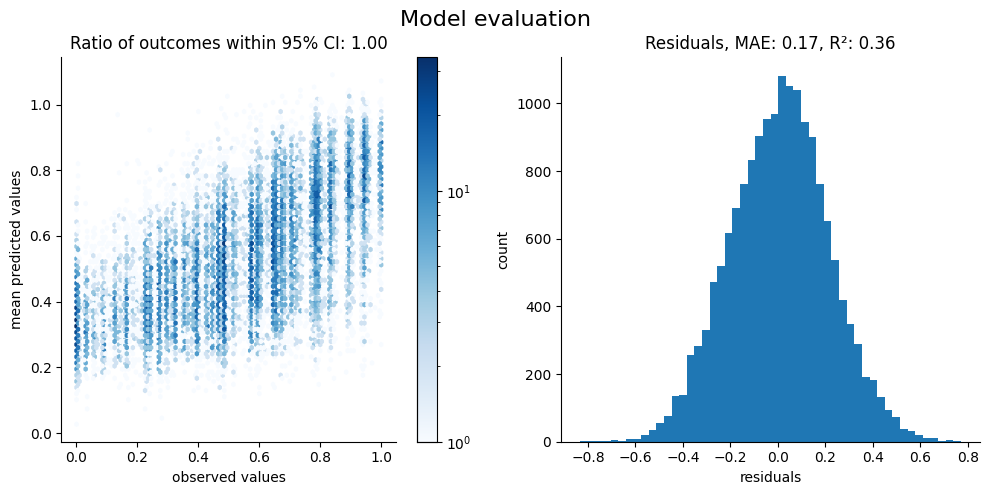

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-31 10:26:10,219 - Starting SVI inference with 1000 iterations.
2024-12-31 10:26:10,245 - Step 0, elbo loss: 74125.44720926449
2024-12-31 10:26:14,857 - Step 200, elbo loss: 61549.10793220511
2024-12-31 10:26:18,939 - Step 400, elbo loss: 59185.03693860545
2024-12-31 10:26:23,002 - Step 600, elbo loss: 58853.8620539789
2024-12-31 10:26:26,739 - Step 800, elbo loss: 58327.66645780172
2024-12-31 10:26:30,567 - SVI inference completed in 20.35 seconds.


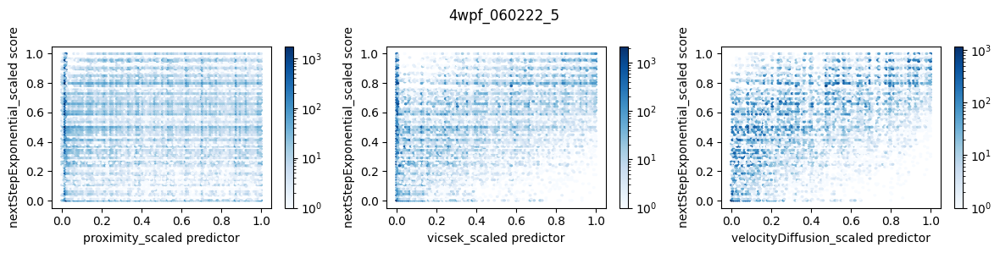

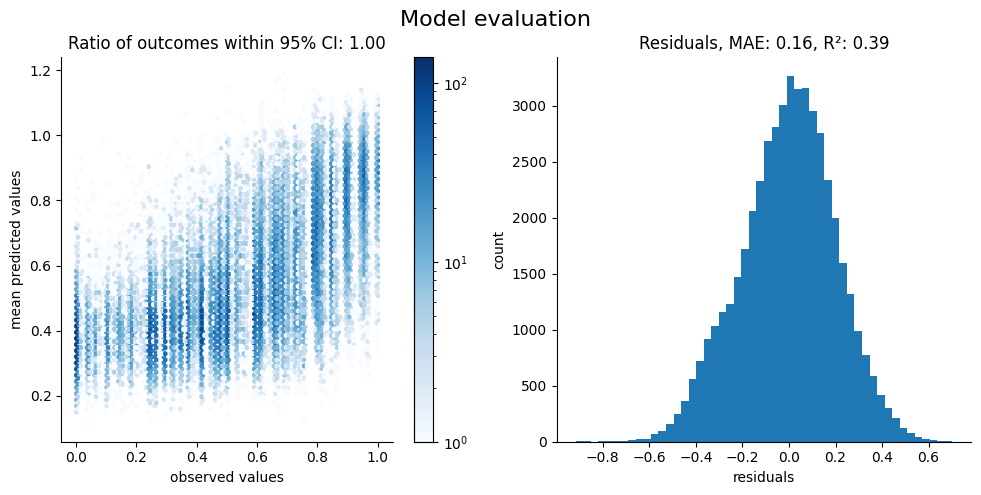

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-31 10:26:47,367 - Starting SVI inference with 1000 iterations.
2024-12-31 10:26:47,403 - Step 0, elbo loss: 124788.121806927
2024-12-31 10:26:51,695 - Step 200, elbo loss: 103485.69862847078
2024-12-31 10:26:56,398 - Step 400, elbo loss: 100295.22591218259
2024-12-31 10:27:01,554 - Step 600, elbo loss: 99507.54506096656
2024-12-31 10:27:06,062 - Step 800, elbo loss: 98832.17308888133
2024-12-31 10:27:10,928 - SVI inference completed in 23.56 seconds.


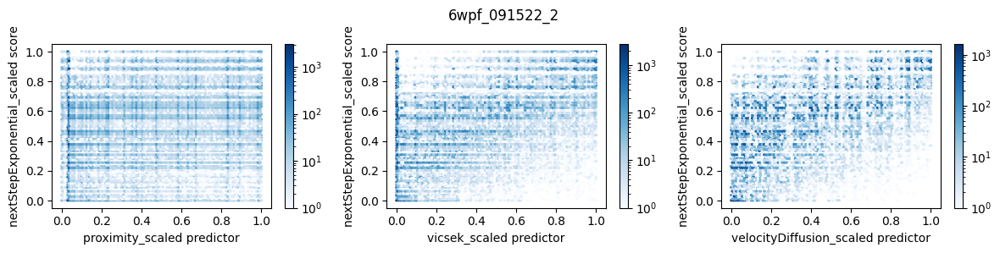

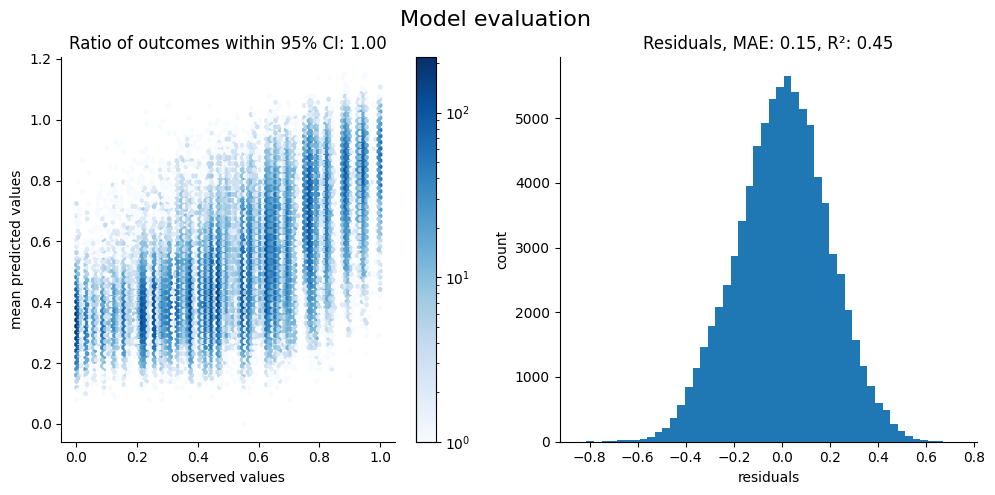

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-31 10:27:32,296 - Starting SVI inference with 1000 iterations.
2024-12-31 10:27:32,337 - Step 0, elbo loss: 190832.00257022306
2024-12-31 10:27:38,562 - Step 200, elbo loss: 159193.37073442142
2024-12-31 10:27:44,606 - Step 400, elbo loss: 152275.85747106813
2024-12-31 10:27:50,965 - Step 600, elbo loss: 151653.29666780765
2024-12-31 10:27:56,083 - Step 800, elbo loss: 149763.3559831734
2024-12-31 10:28:01,221 - SVI inference completed in 28.92 seconds.


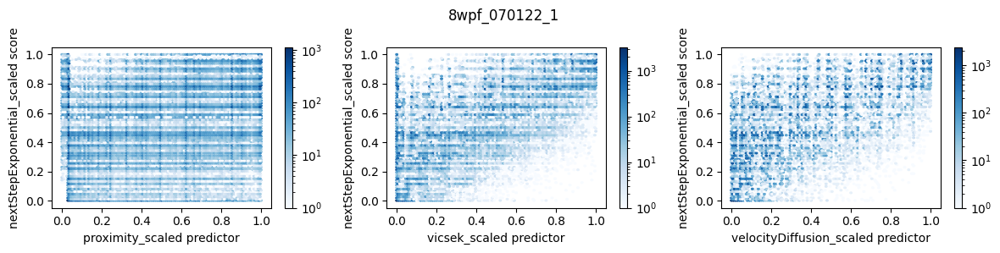

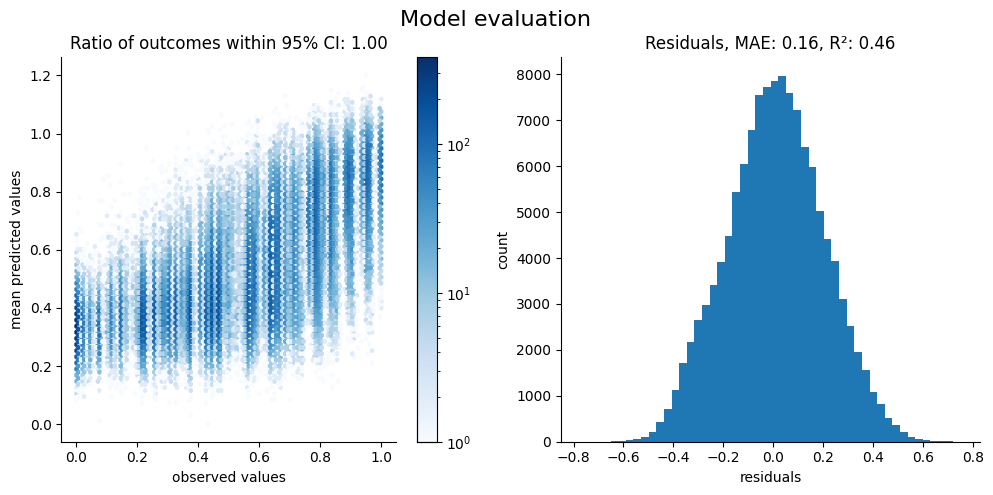

In [208]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled[exp] = samples

## Since big turns are rare in the data, it is possible that the contribution of `proximity` and `vicsek` are overshadowed by `velocityDiffusion`.
### Repeat above using only the first two predictors

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-31 10:28:18,175 - Starting SVI inference with 1000 iterations.
2024-12-31 10:28:18,197 - Step 0, elbo loss: 26284.833172692426
2024-12-31 10:28:21,537 - Step 200, elbo loss: 20514.48929300851
2024-12-31 10:28:24,649 - Step 400, elbo loss: 20139.441171251547
2024-12-31 10:28:28,241 - Step 600, elbo loss: 19967.65986747673
2024-12-31 10:28:31,192 - Step 800, elbo loss: 19930.483880437714
2024-12-31 10:28:33,962 - SVI inference completed in 15.79 seconds.


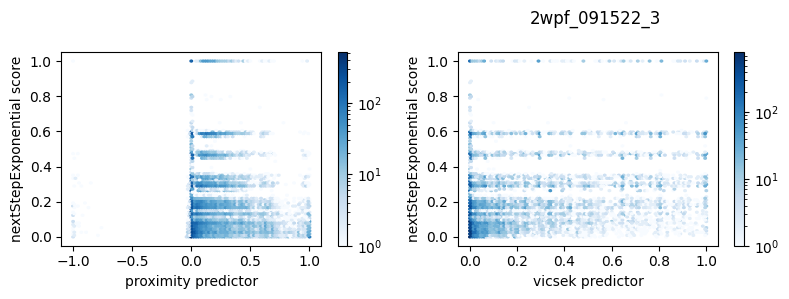

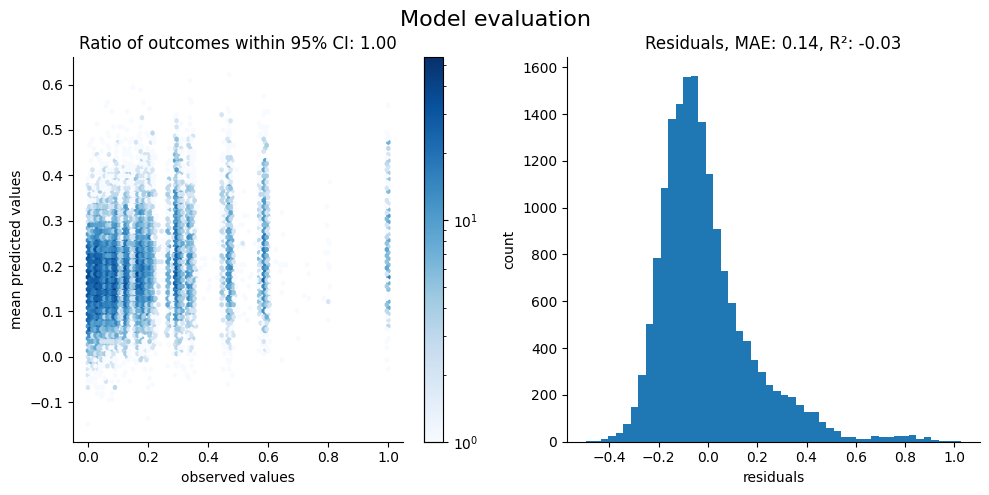

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-31 10:28:45,353 - Starting SVI inference with 1000 iterations.
2024-12-31 10:28:45,383 - Step 0, elbo loss: 71231.64524427988
2024-12-31 10:28:48,869 - Step 200, elbo loss: 58738.836286196994
2024-12-31 10:28:52,417 - Step 400, elbo loss: 57600.81675226449
2024-12-31 10:28:56,286 - Step 600, elbo loss: 57423.868131764575
2024-12-31 10:28:59,982 - Step 800, elbo loss: 57243.03583634294
2024-12-31 10:29:03,821 - SVI inference completed in 18.47 seconds.


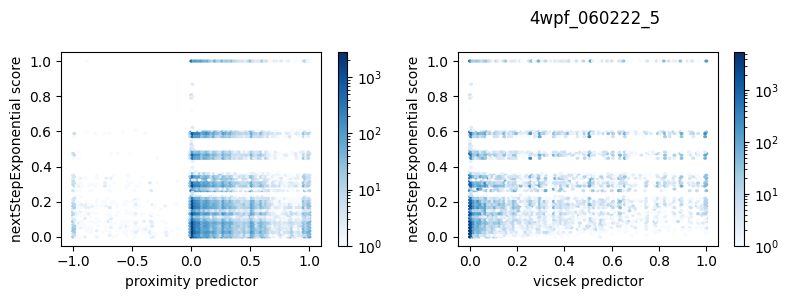

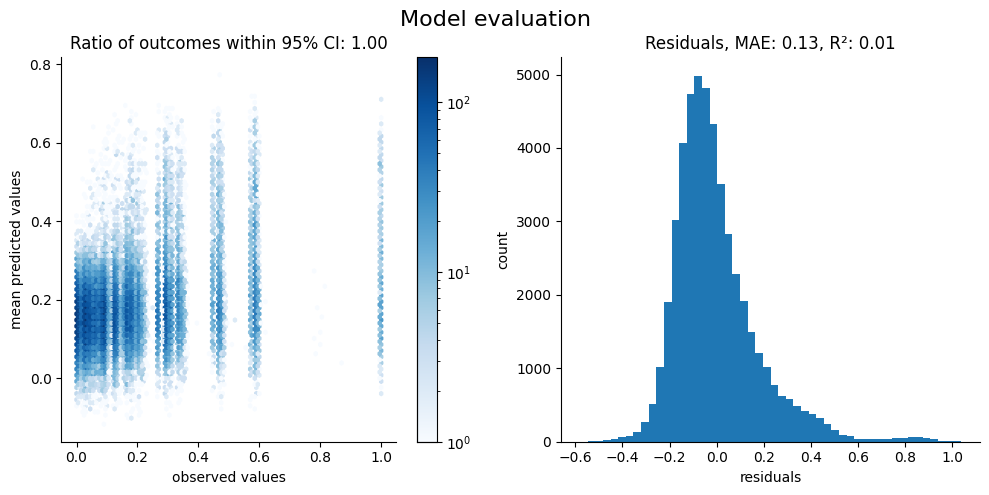

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-31 10:29:17,725 - Starting SVI inference with 1000 iterations.
2024-12-31 10:29:17,760 - Step 0, elbo loss: 134065.25026294883
2024-12-31 10:29:22,255 - Step 200, elbo loss: 100862.39036055122
2024-12-31 10:29:26,052 - Step 400, elbo loss: 98948.94228548251
2024-12-31 10:29:30,178 - Step 600, elbo loss: 97823.22070002375
2024-12-31 10:29:34,003 - Step 800, elbo loss: 97530.01415253666
2024-12-31 10:29:38,243 - SVI inference completed in 20.52 seconds.


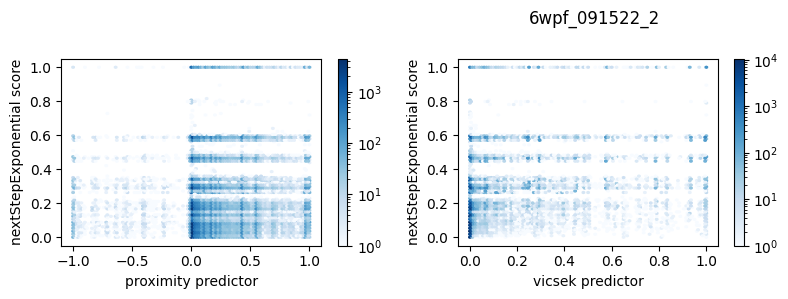

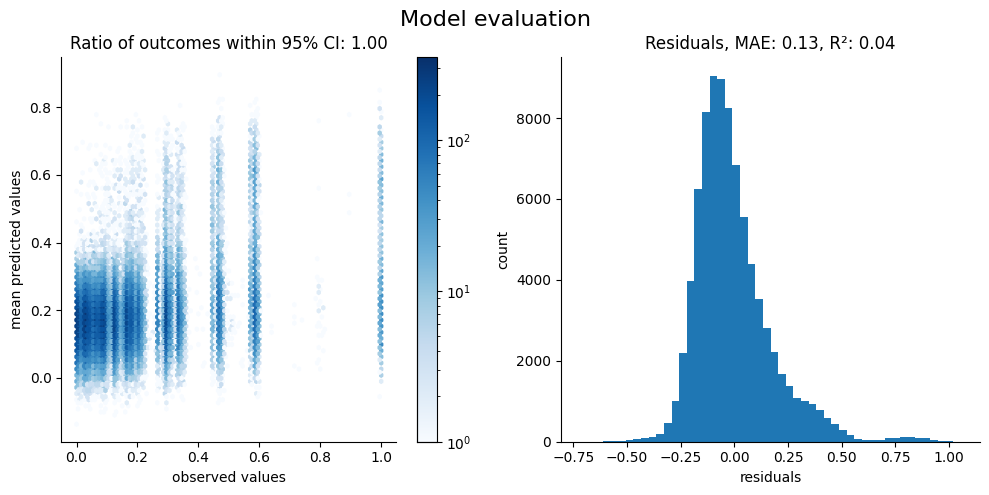

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-31 10:29:54,411 - Starting SVI inference with 1000 iterations.
2024-12-31 10:29:54,494 - Step 0, elbo loss: 254998.2915254448
2024-12-31 10:29:59,682 - Step 200, elbo loss: 151303.8738965637
2024-12-31 10:30:04,289 - Step 400, elbo loss: 150181.5620903871
2024-12-31 10:30:09,192 - Step 600, elbo loss: 147360.90580275893
2024-12-31 10:30:14,815 - Step 800, elbo loss: 147000.81331220845
2024-12-31 10:30:19,798 - SVI inference completed in 25.39 seconds.


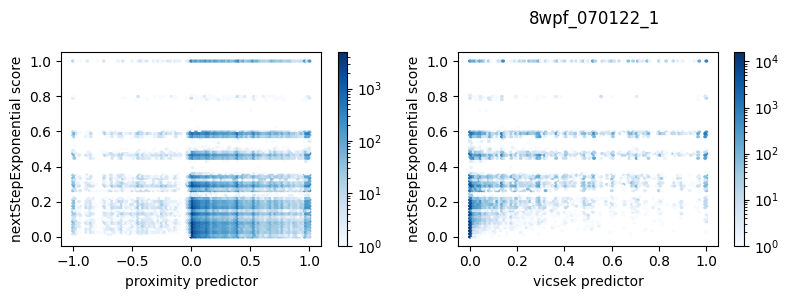

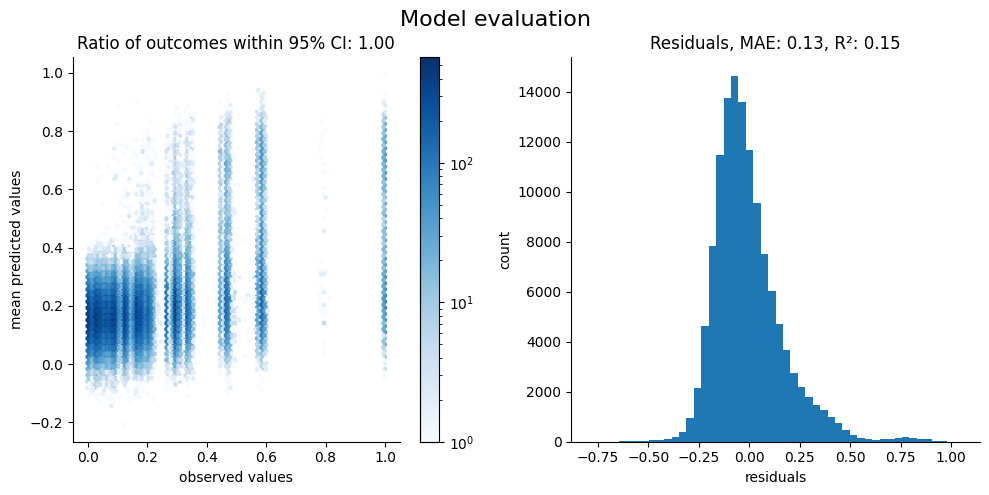

In [209]:
coefficients_raw_no_diffusion = {}
predictor_names = ["proximity", "vicsek"]
score_names = ["nextStepExponential"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw_no_diffusion[exp] = samples

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-31 10:30:34,347 - Starting SVI inference with 1000 iterations.
2024-12-31 10:30:34,368 - Step 0, elbo loss: 25181.717973968203
2024-12-31 10:30:37,351 - Step 200, elbo loss: 21881.486187754657
2024-12-31 10:30:40,209 - Step 400, elbo loss: 21308.61567613086
2024-12-31 10:30:42,975 - Step 600, elbo loss: 21115.100520963795
2024-12-31 10:30:45,982 - Step 800, elbo loss: 21050.613318991862
2024-12-31 10:30:48,909 - SVI inference completed in 14.56 seconds.


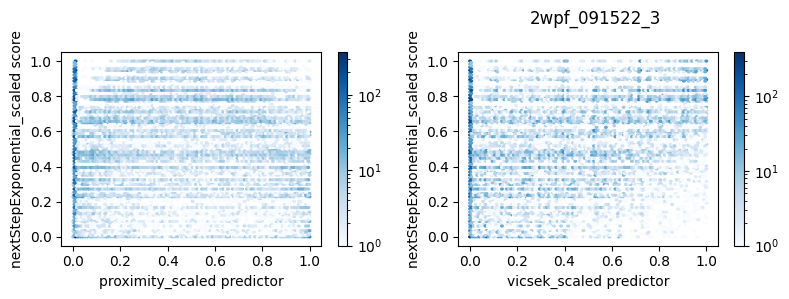

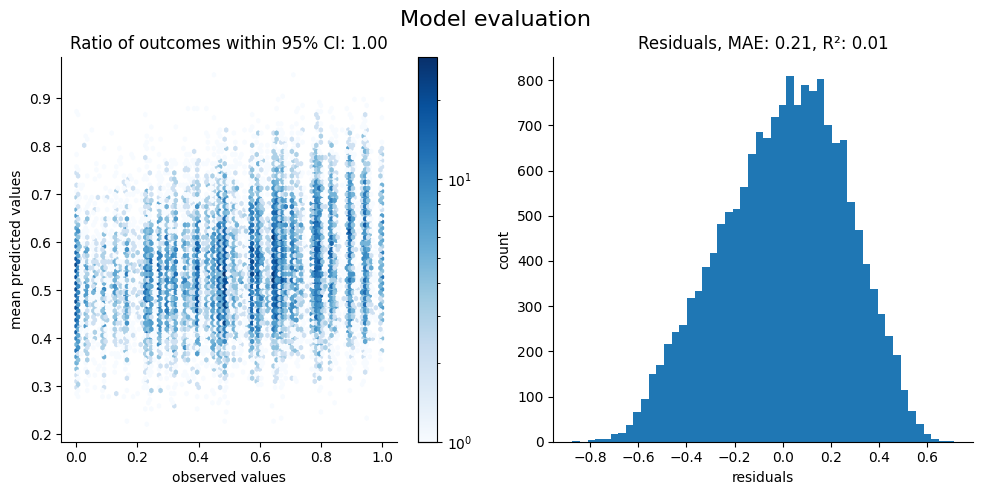

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-31 10:30:59,494 - Starting SVI inference with 1000 iterations.
2024-12-31 10:30:59,540 - Step 0, elbo loss: 71018.77718766531
2024-12-31 10:31:03,117 - Step 200, elbo loss: 62287.02361498125
2024-12-31 10:31:06,309 - Step 400, elbo loss: 60772.303951391674
2024-12-31 10:31:09,757 - Step 600, elbo loss: 60299.739387169
2024-12-31 10:31:13,224 - Step 800, elbo loss: 60246.41576295963
2024-12-31 10:31:16,883 - SVI inference completed in 17.39 seconds.


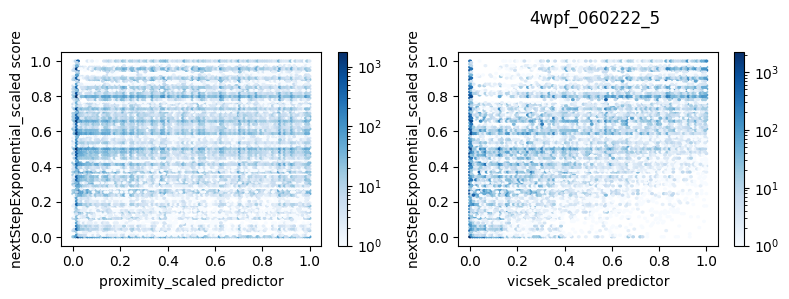

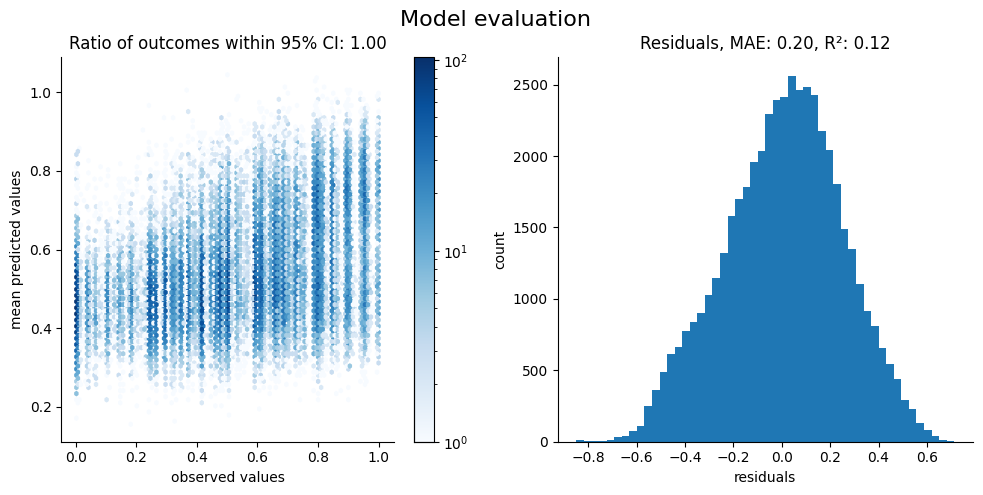

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-31 10:31:30,605 - Starting SVI inference with 1000 iterations.
2024-12-31 10:31:30,641 - Step 0, elbo loss: 121185.65110001902
2024-12-31 10:31:34,485 - Step 200, elbo loss: 105467.39350394823
2024-12-31 10:31:38,448 - Step 400, elbo loss: 103174.8922373291
2024-12-31 10:31:42,285 - Step 600, elbo loss: 102097.49955816776
2024-12-31 10:31:46,182 - Step 800, elbo loss: 101673.01377291116
2024-12-31 10:31:50,111 - SVI inference completed in 19.50 seconds.


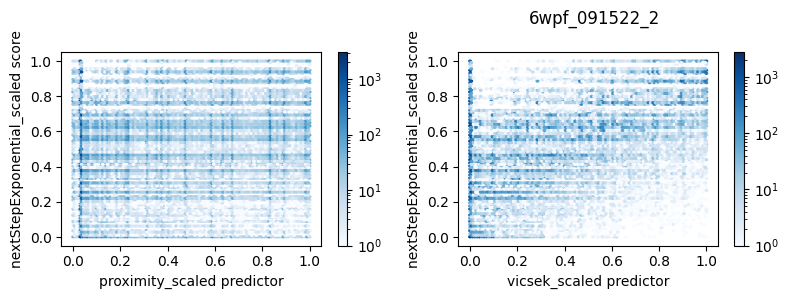

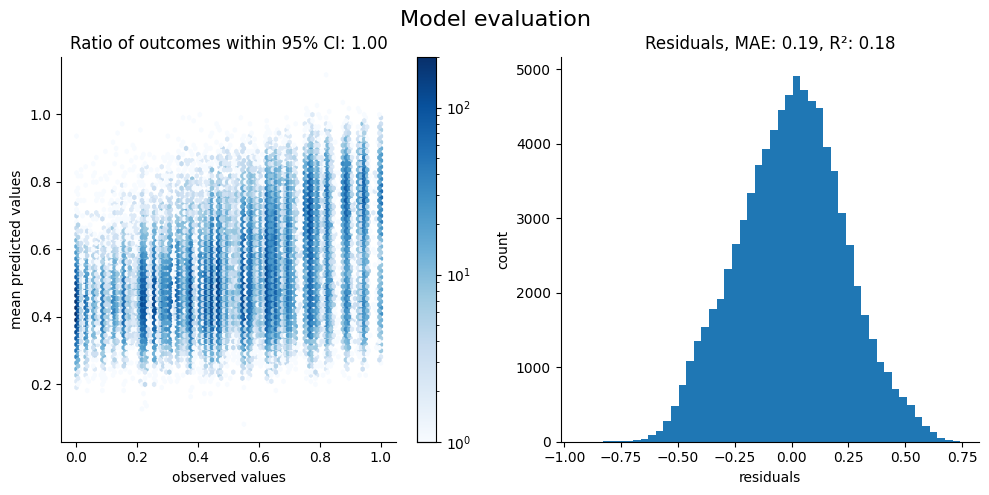

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-31 10:32:07,062 - Starting SVI inference with 1000 iterations.
2024-12-31 10:32:07,101 - Step 0, elbo loss: 188440.5440522302
2024-12-31 10:32:12,222 - Step 200, elbo loss: 159690.65835403118
2024-12-31 10:32:17,225 - Step 400, elbo loss: 152964.87076609812
2024-12-31 10:32:23,697 - Step 600, elbo loss: 151733.52525228483
2024-12-31 10:32:28,614 - Step 800, elbo loss: 151205.8670968585
2024-12-31 10:32:33,851 - SVI inference completed in 26.79 seconds.


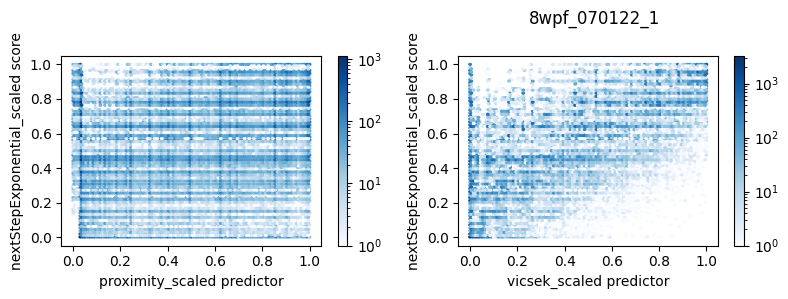

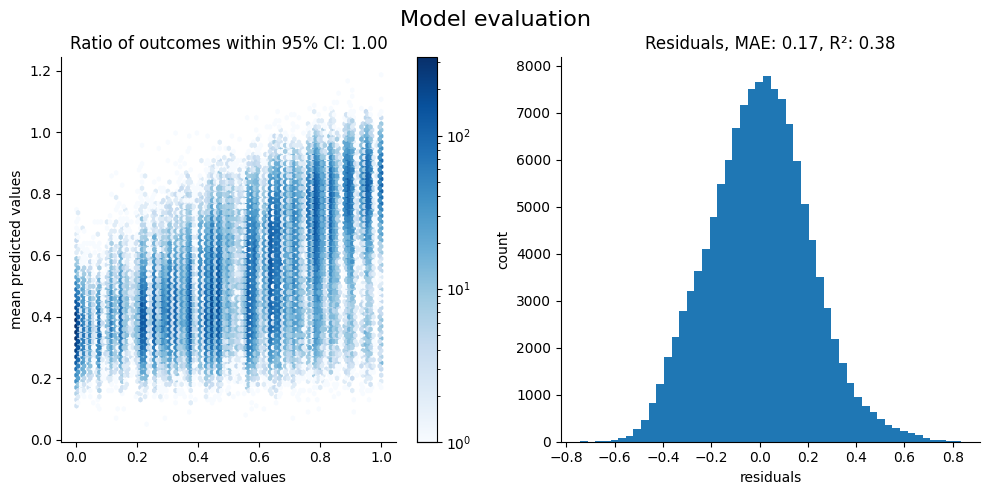

In [210]:
coefficients_scaled_no_diffusion = {}
predictor_names = ["proximity_scaled", "vicsek_scaled"]
score_names = ["nextStepExponential_scaled"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled_no_diffusion[exp] = samples

In [211]:
def plot_comparative_results(samples,title):
    fig, ax = plt.subplots(1,1, figsize=(5,5))
    ax.axhline(0,linestyle="--",color='k')
    ax.axvline(0,linestyle="--",color='k')

    for exp,sample in samples.items():
        try:
            p = sample["weight_proximity"]
            v = sample["weight_vicsek"]
        except KeyError:
            p = sample["weight_proximity_scaled"]
            v = sample["weight_vicsek_scaled"]

        ax.scatter(p,v,alpha=0.3,label=exp,s=5)

    ax.set_xlabel("proximity coefficient")
    ax.set_ylabel("vicsek coefficient")
    ax.set_xlim([-0.2,0.6])
    ax.set_ylim([-0.2,0.6])
    ax.legend()
    fig.suptitle(title)

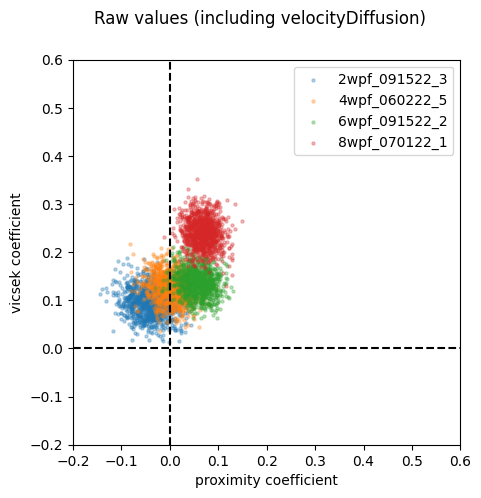

In [212]:
plot_comparative_results(coefficients_raw,"Raw values (including velocityDiffusion)")

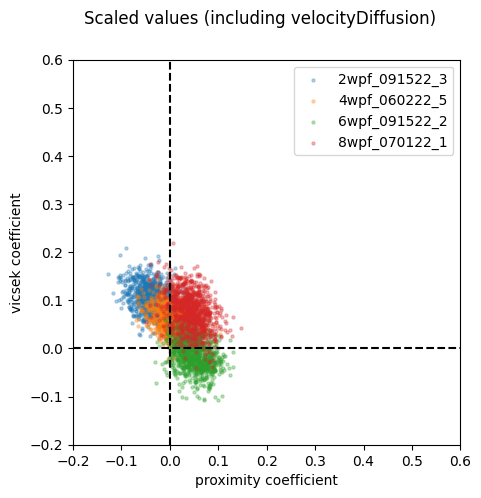

In [213]:
plot_comparative_results(coefficients_scaled,"Scaled values (including velocityDiffusion)")

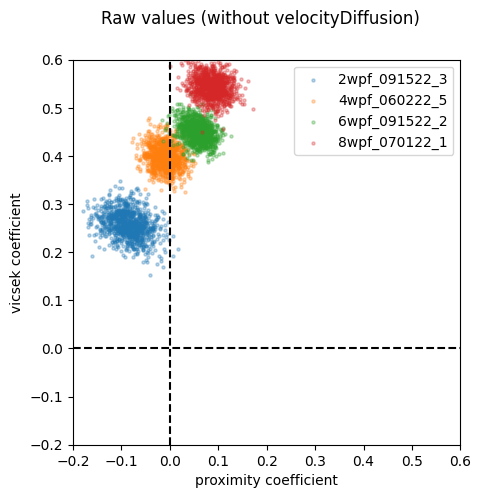

In [214]:
plot_comparative_results(coefficients_raw_no_diffusion,"Raw values (without velocityDiffusion)")

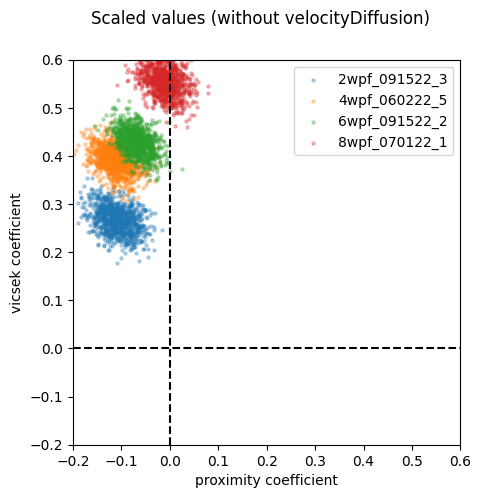

In [215]:
plot_comparative_results(coefficients_scaled_no_diffusion,"Scaled values (without velocityDiffusion)")